# 3. Exploratory data analysis

## 3.1 Imports

In [63]:
# Import numpy, pandas, matplotlib.pyplot, and seaborn and os.
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import Normalize
from scipy.stats import chi2_contingency
from scipy.stats import levene
from scipy.stats import ttest_ind
from sklearn.ensemble import RandomForestClassifier
from sklearn.impute import SimpleImputer
from sklearn.inspection import permutation_importance
import os

## 3.2 Load previously processed data

In [2]:
# Intermediate data was saved as '../data/baf_processed.csv.gz' previously.
baf_data = pd.read_csv('../data/baf_processed.csv.gz', compression='gzip')

In [3]:
# View the first 5 rows.
baf_data.head()

,fraud_bool,email_is_free,phone_home_valid,phone_mobile_valid,has_other_cards,foreign_request,keep_alive_session,payment_type,employment_status,housing_status,...,velocity_4w,bank_branch_count_8w,date_of_birth_distinct_emails_4w,credit_risk_score,bank_months_count,proposed_credit_limit,session_length_in_minutes,device_distinct_emails_8w,device_fraud_count,month
0,1,0,1,0,0,0,0,AA,CA,BA,...,3863.647740,1,6,185,24.0,500.0,3.888115,1.0,0,7
1,1,1,0,0,0,0,0,AB,CA,BA,...,3124.298166,718,3,259,15.0,1500.0,31.798819,1.0,0,7
2,1,1,0,1,0,0,0,AC,CB,BA,...,3159.590679,1,14,177,NaN,200.0,4.728705,1.0,0,7
3,1,1,0,1,1,0,0,AB,CA,BA,...,3022.261812,1921,6,110,31.0,200.0,2.047904,1.0,0,7
4,1,1,1,0,0,0,1,AB,CA,BA,...,3087.670952,1990,2,295,31.0,1500.0,3.775225,1.0,0,7


In [4]:
# Validate data types and non-null values.
baf_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000000 entries, 0 to 999999
Data columns (total 32 columns):
 #   Column                            Non-Null Count    Dtype  
---  ------                            --------------    -----  
 0   fraud_bool                        1000000 non-null  int64  
 1   email_is_free                     1000000 non-null  int64  
 2   phone_home_valid                  1000000 non-null  int64  
 3   phone_mobile_valid                1000000 non-null  int64  
 4   has_other_cards                   1000000 non-null  int64  
 5   foreign_request                   1000000 non-null  int64  
 6   keep_alive_session                1000000 non-null  int64  
 7   payment_type                      1000000 non-null  object 
 8   employment_status                 1000000 non-null  object 
 9   housing_status                    1000000 non-null  object 
 10  source                            1000000 non-null  object 
 11  device_os                         1000

`categorical` datatype property was not preserved after saving dataframe to csv file. Convert the types again.

In [5]:
# Convert the first 12 columns to categorical datatype.
categorical_list = list(baf_data.columns)[0:12]
print(categorical_list)
for col in categorical_list:
    baf_data[col] = baf_data[col].astype('category')

['fraud_bool', 'email_is_free', 'phone_home_valid', 'phone_mobile_valid', 'has_other_cards', 'foreign_request', 'keep_alive_session', 'payment_type', 'employment_status', 'housing_status', 'source', 'device_os']


In [6]:
# Validate data types again.
baf_data.dtypes

fraud_bool                          category
email_is_free                       category
phone_home_valid                    category
phone_mobile_valid                  category
has_other_cards                     category
foreign_request                     category
keep_alive_session                  category
payment_type                        category
employment_status                   category
housing_status                      category
source                              category
device_os                           category
income                               float64
name_email_similarity                float64
prev_address_months_count            float64
current_address_months_count         float64
customer_age                           int64
days_since_request                   float64
intended_balcon_amount               float64
zip_count_4w                           int64
velocity_6h                          float64
velocity_24h                         float64
velocity_4

Now it looks right.

## 3.3 Explore the data

### 3.3.1 Previous negative values

After verifying with the dataset authors about the negative values found in 02_data_wranging.ipynb, it has been confirmed that negative values in `session_length_in_minutes`, `and device_distinct_emails_8w` and `velocity_6h` do represent missing values. "-1" in the first two columns had been replaced with np.NaN. Negatives in `velocity_6h` will be replaced with np.NaN as well next.

Negative values in `credit_risk_score` are indeed part of the original distribution. It is likely due to a standardization process of the feature. They will be kept without change.

While we found `intended_balcon_amount` has high percentage of instances (74.3% of all) with continuous negative values distribution, and 98.7% of those instances are not fraud. The dataset author said the majority of `intended_balcon_amount` have missing values in the original distribution, and these missing values correspond to the negatives. But even with the missing values the feature is informative, as it is correlated to the fraud_bool label. The negative values will be replace with np.NaN. Missing values imputing may be tested with different ways to compare in later stage. And a new categorical column `intended_balcon_amount_negative` will be added to keep track of whether it's negative originally.

In [7]:
# Replace 'velocity_6h' negatives with np.NaN in baf_data
baf_data['velocity_6h'] = baf_data['velocity_6h'].apply(lambda x: x if x >= 0 else np.NaN)

# Count 'velocity_6h' missing values
baf_data['velocity_6h'].isna().sum()

44

In [8]:
# Create a new column 'intended_balcon_amount_negative' before the first numeric column 'income'
# Set the value to 1 if 'intended_balcon_amount' negative, else to 0.
# Convert 'intended_balcon_amount_negative' to categorical type.
baf_data.insert(baf_data.columns.get_loc('income'), 'intended_balcon_amount_negative', baf_data['intended_balcon_amount'].apply(lambda x: 1 if x < 0 else 0))
baf_data['intended_balcon_amount_negative'] = baf_data['intended_balcon_amount_negative'].astype('category')

# Replace 'intended_balcon_amount' negatives with np.NaN in baf_data
baf_data['intended_balcon_amount'] = baf_data['intended_balcon_amount'].apply(lambda x: x if x >= 0 else np.NaN)

# Count 'intended_balcon_amount' missing values
baf_data['intended_balcon_amount'].isna().sum()

742523

In [9]:
# Check datatypes and non-null value counts again
baf_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000000 entries, 0 to 999999
Data columns (total 33 columns):
 #   Column                            Non-Null Count    Dtype   
---  ------                            --------------    -----   
 0   fraud_bool                        1000000 non-null  category
 1   email_is_free                     1000000 non-null  category
 2   phone_home_valid                  1000000 non-null  category
 3   phone_mobile_valid                1000000 non-null  category
 4   has_other_cards                   1000000 non-null  category
 5   foreign_request                   1000000 non-null  category
 6   keep_alive_session                1000000 non-null  category
 7   payment_type                      1000000 non-null  category
 8   employment_status                 1000000 non-null  category
 9   housing_status                    1000000 non-null  category
 10  source                            1000000 non-null  category
 11  device_os                

### 3.3.2 Missing values

In [10]:
# Count the number of missing values and the percentages in each column of baf_data.
# Order them by decreasing using sort_values
# Call `pd.concat` to present these in a single table (DataFrame) with the helpful column names 'count' and '%'
missing = pd.concat([baf_data.isna().sum(), 100 * baf_data.isna().mean()], axis=1)
missing.columns=['count', '%']
missing.sort_values(by='%', ascending=False)

,count,%
intended_balcon_amount,742523,74.2523
prev_address_months_count,712920,71.2920
bank_months_count,253635,25.3635
current_address_months_count,4254,0.4254
session_length_in_minutes,2015,0.2015
device_distinct_emails_8w,359,0.0359
velocity_6h,44,0.0044
velocity_4w,0,0.0000
zip_count_4w,0,0.0000
velocity_24h,0,0.0000


In [11]:
# Count the number of missing values groupby fraud_bool, and the percentages in groups of each column.
missing2 = pd.concat([baf_data.isnull().groupby(baf_data['fraud_bool']).sum(), 100 * baf_data.isnull().groupby(baf_data['fraud_bool']).mean()], axis=0).T
# missing2
# Change missing2 column names to 'fraud_0_count','fraud_1_count', 'fraud_0_%', 'fraud_1_%, and sort values by 'fraud_1_%'.
missing2.columns=['fraud_0_count', 'fraud_1_count', 'fraud_0_%', 'fraud_1_%']
missing2.sort_values(by='fraud_0_%', ascending=False)

,fraud_0_count,fraud_1_count,fraud_0_%,fraud_1_%
intended_balcon_amount,732776.0,9747.0,74.094791,88.376099
prev_address_months_count,702786.0,10134.0,71.062347,91.885030
bank_months_count,249495.0,4140.0,25.227737,37.537401
current_address_months_count,4240.0,14.0,0.428728,0.126938
session_length_in_minutes,1997.0,18.0,0.201927,0.163206
device_distinct_emails_8w,355.0,4.0,0.035896,0.036268
velocity_6h,44.0,0.0,0.004449,0.000000
velocity_4w,0.0,0.0,0.000000,0.000000
zip_count_4w,0.0,0.0,0.000000,0.000000
velocity_24h,0.0,0.0,0.000000,0.000000


As we can see, missing values distribution between not_fraud and fraud groups is mostly close or higher in not_fraud group. `current_address_months_count`, `session_length_in_minutes`, `device_distinct_emails_8w` and `velocity_6h` have missing value counts below 1%. Those missing values rows may be safe to drop.

In [12]:
# Drop rows with missing values of 1% or lower of the column
threshold = len(baf_data) * 0.01
cols_to_drop = baf_data.columns[baf_data.isna().sum() <= threshold]
baf_data.dropna(subset=cols_to_drop, inplace=True)

In [13]:
# Count missing values again.
baf_data.isna().sum().sort_values(ascending=False)

intended_balcon_amount              736760
prev_address_months_count           711168
bank_months_count                   251243
fraud_bool                               0
bank_branch_count_8w                     0
zip_count_4w                             0
velocity_6h                              0
velocity_24h                             0
velocity_4w                              0
date_of_birth_distinct_emails_4w         0
customer_age                             0
credit_risk_score                        0
proposed_credit_limit                    0
session_length_in_minutes                0
device_distinct_emails_8w                0
device_fraud_count                       0
days_since_request                       0
current_address_months_count             0
email_is_free                            0
name_email_similarity                    0
income                                   0
intended_balcon_amount_negative          0
device_os                                0
source     

`intended_balcon_amount`, `prev_address_months_count` and `bank_months_count` has 25 ~ 75% missing values. More exploratory analysis need to be done before finding method for imputing.

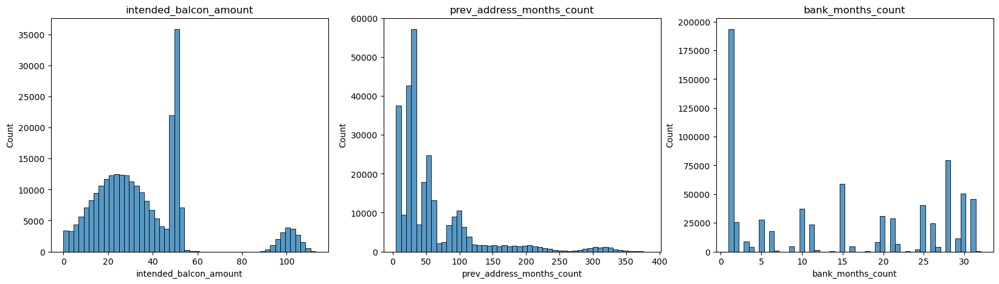

In [14]:
# Plot histograms of `intended_balcon_amount`, `prev_address_months_count` and `bank_months_count` to visulize their data distribution.
na_col = ['intended_balcon_amount', 'prev_address_months_count', 'bank_months_count']

# Create a figure with 3 subplots in a row
fig, axs = plt.subplots(1, 3, figsize=(20, 5))
fig.subplots_adjust(wspace=0.2)

for i, col in enumerate(na_col):
    sns.histplot(data=baf_data, x=col, bins=50, ax=axs[i])
    axs[i].set_title(col)

plt.show()

Their distributions are not close to normal. Missing data imputing may be tried with median or other methods later on in modeling and compare.

### 3.3.3 Explore categorical features

In [15]:
# Get all categorical column names into a list
cate_col = baf_data.select_dtypes('category').columns.to_list()
print(cate_col)

['fraud_bool', 'email_is_free', 'phone_home_valid', 'phone_mobile_valid', 'has_other_cards', 'foreign_request', 'keep_alive_session', 'payment_type', 'employment_status', 'housing_status', 'source', 'device_os', 'intended_balcon_amount_negative']


In [16]:
# Print target column `fraud_bool` value count
print(baf_data['fraud_bool'].value_counts())
# Print the pencentage of fraud instances of all records
print('fraud records percentage:', len(baf_data[baf_data['fraud_bool']==1]) / len(baf_data))

0    982568
1     10995
Name: fraud_bool, dtype: int64
fraud records percentage: 0.011066233344035557


Compared to the not_fraud category, fraud category has much less counts, only about 1.1%. Quite imbalanced.

In [17]:
# Calculate summary statistics of categorical columns, grouped by target column `fraud_bool`
stat_summary_cate = baf_data[cate_col].groupby('fraud_bool').describe()
# Print each categorical feature's result
for col in cate_col[1:]:
    print(f'\nSummary statics for {col}:')
    print(stat_summary_cate[col])



Summary statics for email_is_free:
             count  unique  top    freq
fraud_bool                             
0           982568       2    1  518812
1            10995       2    1    7264

Summary statics for phone_home_valid:
             count  unique  top    freq
fraud_bool                             
0           982568       2    0  570749
1            10995       2    0    8215

Summary statics for phone_mobile_valid:
             count  unique  top    freq
fraud_bool                             
0           982568       2    1  874564
1            10995       2    1    9350

Summary statics for has_other_cards:
             count  unique  top    freq
fraud_bool                             
0           982568       2    0  761595
1            10995       2    0   10065

Summary statics for foreign_request:
             count  unique  top    freq
fraud_bool                             
0           982568       2    0  958015
1            10995       2    0   10440

Summary

Both not_fraud and fraud categories have all unique values distribution of categorical features, while top count for `keep_alive_session`, `payment_type`, `housing_status`, and `device_os` showed differences. But we cannot get too much information here. Let's visualize them in plots.

In [18]:
# Draw countplot of categorical features grouped by 'fraud_bool'
# 'fraud_bool' count histogram is available in 02_data_wranging.ipynb
#fig, axs = plt.subplots(4, 3, figsize=(20, 20))

#for i, col in enumerate(cate_col[1:]):
#    row = i // 3
#    pos = i % 3
#    sns.countplot(data=baf_data, x=col, hue='fraud_bool', ax=axs[row][pos])
#    axs[row][pos].set_title(col)

#plt.tight_layout()
#plt.show()

The fraud counts in each feature are much lower and not easy to compare when the not_fraud counts are much higher. Let's try another way by normalizing counts to `fraud_bool` groups, and draw categorical features normalized counts on y-axix against `fraud_bool` on x-axis and see.

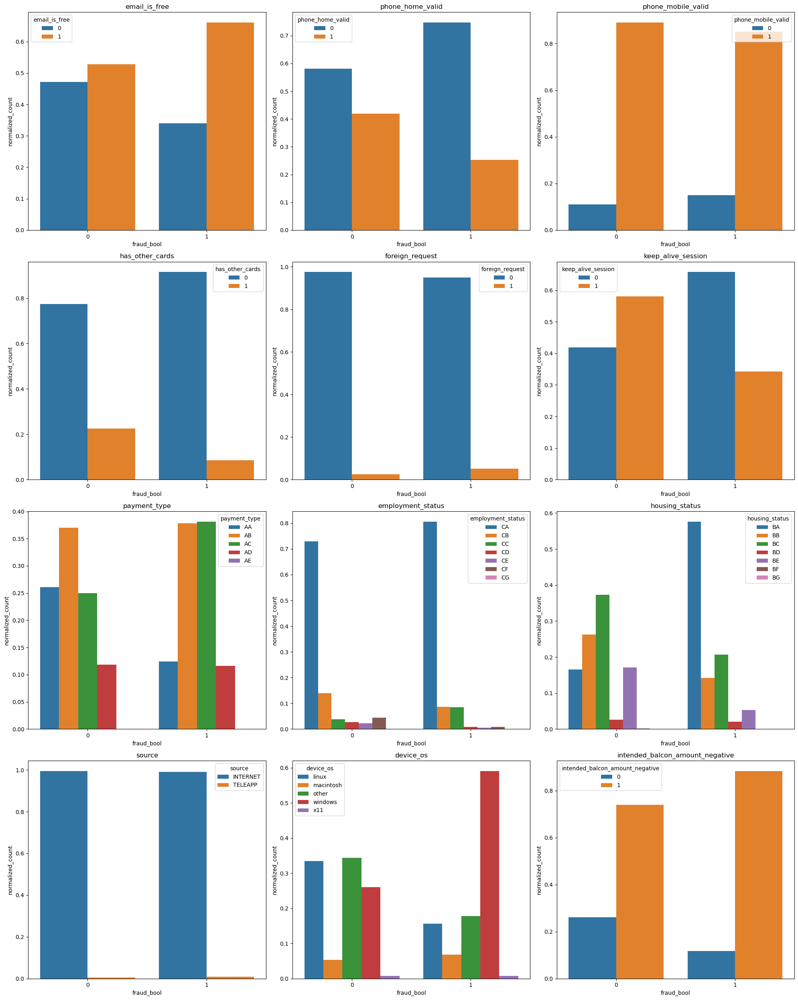

In [19]:
# Draw plots of categorical features normalized counts by fraud status and features
fig, axs = plt.subplots(4, 3, figsize=(20, 25))

for i, col in enumerate(cate_col[1:]):
    row = i // 3
    pos = i % 3
    # Compute the total count for each category
    total_counts = baf_data.groupby('fraud_bool')[col].count()
    # Normalize the counts
    normalized_counts = baf_data.groupby(['fraud_bool', col])[col].count() / total_counts
    # Reset the index to make it easier to plot
    normalized_counts = normalized_counts.reset_index(name='normalized_count')
    # Plot the normalized counts
    sns.barplot(data=normalized_counts, x='fraud_bool', y='normalized_count', hue=col, ax=axs[row][pos])
    axs[row][pos].set_title(col)

plt.tight_layout()
plt.show()


Normalized counts look better. We can tell some different distribution ratio/pattens of feature counts, between fraud and not fraud groups. `keep_alive_session`, `payment_type`, `housing_status`, and `device_os` show more difference in pattens. `email_is_free`, `phone_home_valid`, `has_other_cards`, `foreign_request`, `employment_status`, and `intended_balcon_amount_negative` may also have some pattern difference.

Suppose all categorical features counts are independent from each other, and during data wranging we know each unique value counts of all categorical features are above 5. Let's perform chi-squared test to see whether the count ratio differences between the categorical features and the target `fraud_bool` feature are statistically significant. The Null hypothesis is there is no no association between the testing variables. The significance level p is set to 0.05.

In [20]:
for col in cate_col[1:]:
    # Create a contingency table of the counts for the two categorical variables
    contingency_table = pd.crosstab(baf_data[col], baf_data['fraud_bool'])    # Does it need to normalize? normalize='columns'
    # Perform the chi-squared test
    chi2, pval, dof, expected = chi2_contingency(contingency_table)
    # Print results
    print(f"Chi-squared test results for `{col}` vs. `fraud_bool`:")
    print("Chi-squared statistic:", chi2)
    print("Degrees of freedom:", dof)
    print("p-value:", pval)
    if pval < 0.05:
        print('Significant difference\n')
    else:
        print('Null hypothesis not rejected.\n')


Chi-squared test results for `email_is_free` vs. `fraud_bool`:
Chi-squared statistic: 767.4190589497638
Degrees of freedom: 1
p-value: 6.545282301084269e-169
Significant difference

Chi-squared test results for `phone_home_valid` vs. `fraud_bool`:
Chi-squared statistic: 1235.7450013284042
Degrees of freedom: 1
p-value: 1.039937733961221e-270
Significant difference

Chi-squared test results for `phone_mobile_valid` vs. `fraud_bool`:
Chi-squared statistic: 174.08721498610143
Degrees of freedom: 1
p-value: 9.474108594718481e-40
Significant difference

Chi-squared test results for `has_other_cards` vs. `fraud_bool`:
Chi-squared statistic: 1233.255785009613
Degrees of freedom: 1
p-value: 3.613856775306693e-270
Significant difference

Chi-squared test results for `foreign_request` vs. `fraud_bool`:
Chi-squared statistic: 285.75580775380683
Degrees of freedom: 1
p-value: 4.1816776490804176e-64
Significant difference

Chi-squared test results for `keep_alive_session` vs. `fraud_bool`:
Chi-squa

Interestingly, chi-squared tests indicate there are significant association between all categorical features count and `fraud_fool`. What if normalized to columns?

In [21]:
for col in cate_col[1:]:
    # Create a contingency table of the counts for the two categorical variables
    contingency_table = pd.crosstab(baf_data[col], baf_data['fraud_bool'], normalize='columns')    # normalized to columns
    # Perform the chi-squared test
    chi2, pval, dof, expected = chi2_contingency(contingency_table)
    # Print results
    print(f"Chi-squared test results for `{col}` vs. `fraud_bool`:")
    print("Chi-squared statistic:", chi2)
    print("Degrees of freedom:", dof)
    print("p-value:", pval)
    if pval < 0.05:
        print('Significant difference\n')
    else:
        print('Null hypothesis not rejected.\n')


Chi-squared test results for `email_is_free` vs. `fraud_bool`:
Chi-squared statistic: 0.0
Degrees of freedom: 1
p-value: 1.0
Null hypothesis not rejected.

Chi-squared test results for `phone_home_valid` vs. `fraud_bool`:
Chi-squared statistic: 0.0
Degrees of freedom: 1
p-value: 1.0
Null hypothesis not rejected.

Chi-squared test results for `phone_mobile_valid` vs. `fraud_bool`:
Chi-squared statistic: 0.0
Degrees of freedom: 1
p-value: 1.0
Null hypothesis not rejected.

Chi-squared test results for `has_other_cards` vs. `fraud_bool`:
Chi-squared statistic: 0.0
Degrees of freedom: 1
p-value: 1.0
Null hypothesis not rejected.

Chi-squared test results for `foreign_request` vs. `fraud_bool`:
Chi-squared statistic: 0.0
Degrees of freedom: 1
p-value: 1.0
Null hypothesis not rejected.

Chi-squared test results for `keep_alive_session` vs. `fraud_bool`:
Chi-squared statistic: 0.0
Degrees of freedom: 1
p-value: 1.0
Null hypothesis not rejected.

Chi-squared test results for `payment_type` vs.

Somehow when normalized to columns during crosstab step, Chi-squared test results were opposite.

Question: Does it need to be normalized to columns?

To visulize possible associations between catagorical features pairwisely, Let's try to draw a heatmap of them.

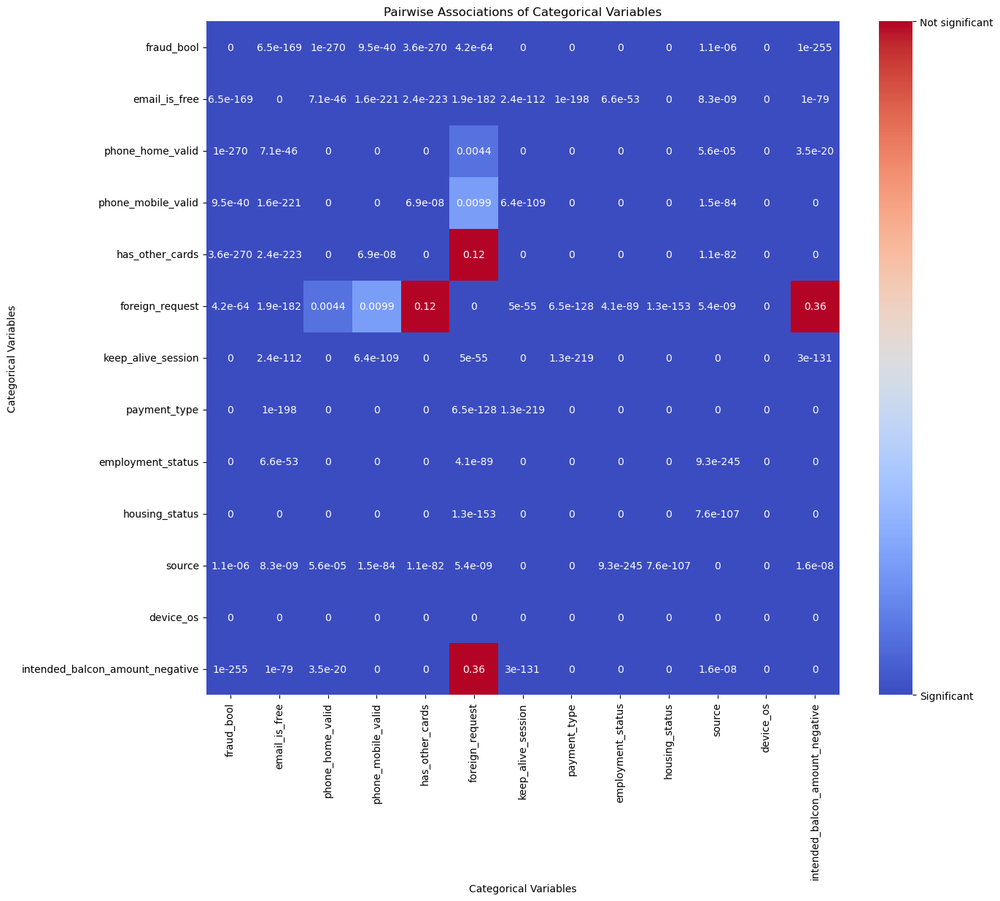

In [22]:
# Create an empty DataFrame to store the p-values
pval_df = pd.DataFrame(index=cate_col, columns=cate_col)

# Compute the p-value for all pairwise combinations of the categorical variables
for col_1 in cate_col:
    for col_2 in cate_col:
        contingency_table = pd.crosstab(baf_data[col_1], baf_data[col_2])    # Does it need to normalize?
        chi2, pval, dof, expected = chi2_contingency(contingency_table)
        pval_df.loc[col_1, col_2] = pval

# Create the heatmap
fig, ax = plt.subplots(figsize=(14, 12))
sns.heatmap(pval_df.astype(float), cmap='coolwarm', annot=True, fmt='.2g', ax=ax, vmin=0, vmax=0.05)

# Add a color bar
cbar = ax.collections[0].colorbar
cbar.set_ticks([0, 0.05])
cbar.set_ticklabels(['Significant', 'Not significant'])

# Set the axis labels and title
ax.set_xlabel('Categorical Variables')
ax.set_ylabel('Categorical Variables')
ax.set_title('Pairwise Associations of Categorical Variables')

plt.show()

p-values for the diagonal cells (one feature vs. itself) are all 0. I thought there should be no association between feature itself and p should be 1. Is there something wrong?

What if normalized?

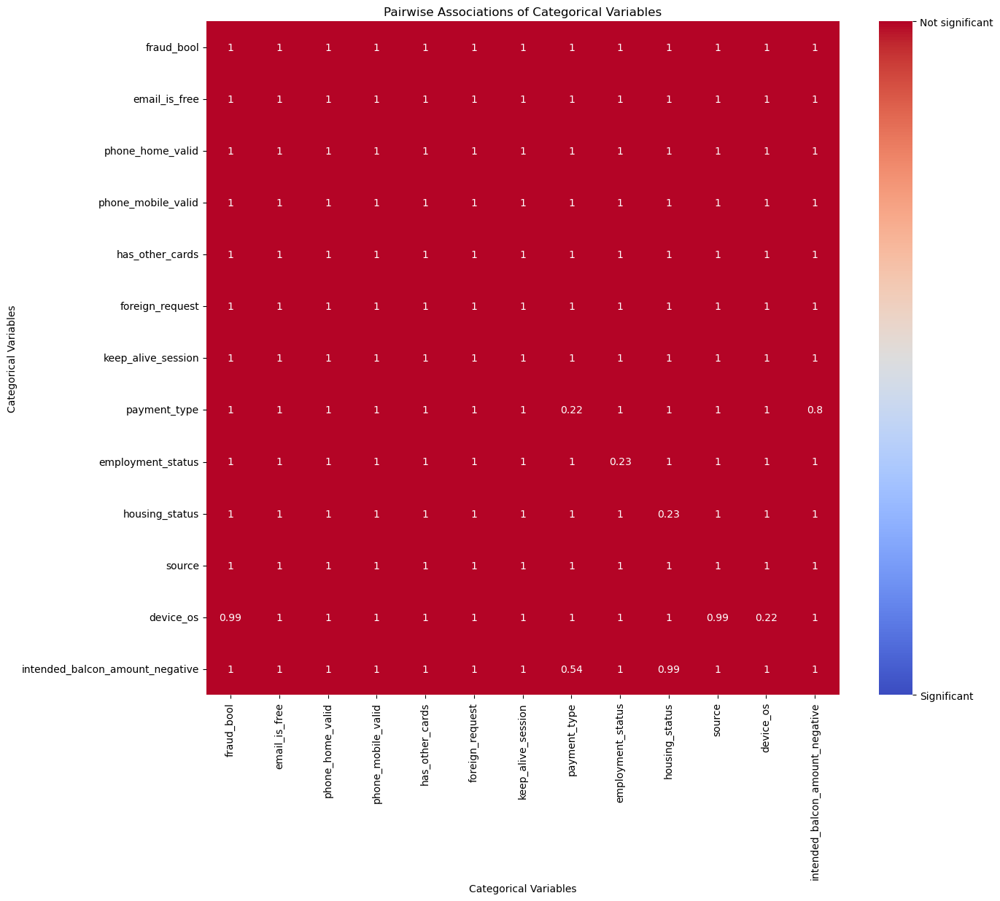

In [23]:
# Create an empty DataFrame to store the p-values
pval_df = pd.DataFrame(index=cate_col, columns=cate_col)

# Compute the p-value for all pairwise combinations of the categorical variables
for col_1 in cate_col:
    for col_2 in cate_col:
        contingency_table = pd.crosstab(baf_data[col_1], baf_data[col_2], normalize='columns')    # normalized
        chi2, pval, dof, expected = chi2_contingency(contingency_table)
        pval_df.loc[col_1, col_2] = pval

# Create the heatmap
fig, ax = plt.subplots(figsize=(14, 12))
sns.heatmap(pval_df.astype(float), cmap='coolwarm', annot=True, fmt='.2g', ax=ax, vmin=0, vmax=0.05)

# Add a color bar
cbar = ax.collections[0].colorbar
cbar.set_ticks([0, 0.05])
cbar.set_ticklabels(['Significant', 'Not significant'])

# Set the axis labels and title
ax.set_xlabel('Categorical Variables')
ax.set_ylabel('Categorical Variables')
ax.set_title('Pairwise Associations of Categorical Variables')

plt.show()

Although normalized bar plots showed some different distribution patterns between `fraud_bool`status. It seems Chi-squared tests didn't help much to test catagorical features associations, probably due to the great difference bwtween fraud and not_fraud instance counts.

### 3.3.4 Explore numeric features

In [24]:
# Save numeric column names into a list
num_col = baf_data.select_dtypes(include='number').columns.tolist()
print(num_col)
print(len(num_col))

['income', 'name_email_similarity', 'prev_address_months_count', 'current_address_months_count', 'customer_age', 'days_since_request', 'intended_balcon_amount', 'zip_count_4w', 'velocity_6h', 'velocity_24h', 'velocity_4w', 'bank_branch_count_8w', 'date_of_birth_distinct_emails_4w', 'credit_risk_score', 'bank_months_count', 'proposed_credit_limit', 'session_length_in_minutes', 'device_distinct_emails_8w', 'device_fraud_count', 'month']
20


In [25]:
# To explore summary statistics and visulation of numeric features grouped by target feature,
# subset tag column `fraud_bool` and numeric columns and save as baf_fraud_bool_num.
baf_fraud_bool_num = baf_data[['fraud_bool'] + num_col]
baf_fraud_bool_num.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 993563 entries, 0 to 999999
Data columns (total 21 columns):
 #   Column                            Non-Null Count   Dtype   
---  ------                            --------------   -----   
 0   fraud_bool                        993563 non-null  category
 1   income                            993563 non-null  float64 
 2   name_email_similarity             993563 non-null  float64 
 3   prev_address_months_count         282395 non-null  float64 
 4   current_address_months_count      993563 non-null  float64 
 5   customer_age                      993563 non-null  int64   
 6   days_since_request                993563 non-null  float64 
 7   intended_balcon_amount            256803 non-null  float64 
 8   zip_count_4w                      993563 non-null  int64   
 9   velocity_6h                       993563 non-null  float64 
 10  velocity_24h                      993563 non-null  float64 
 11  velocity_4w                       99356

In [26]:
# Summary statistics of numeric features grouped by target column ('fraud_bool')
summary_stats = baf_fraud_bool_num.groupby('fraud_bool').describe()

# Print summary statistics for each numeric feature
for col in num_col:
    print(f'\nSummary statistics for {col}:')
    print(summary_stats[col])


Summary statistics for income:
               count      mean       std  min  25%  50%  75%  max
fraud_bool                                                       
0           982568.0  0.561390  0.290292  0.1  0.3  0.6  0.8  0.9
1            10995.0  0.686548  0.265707  0.1  0.6  0.8  0.9  0.9

Summary statistics for name_email_similarity:
               count     mean       std       min       25%       50%  \
fraud_bool                                                              
0           982568.0  0.49503  0.288868  0.000001  0.227134  0.493965   
1            10995.0  0.39349  0.295626  0.000132  0.134389  0.292921   

                 75%       max  
fraud_bool                      
0           0.756484  0.999999  
1           0.676778  0.999953  

Summary statistics for prev_address_months_count:
               count       mean        std  min   25%   50%    75%    max
fraud_bool                                                               
0           281516.0  60.784808  

There are some differences of numeric feature means and quartile distributions betwen 'fraud_bool' groups, such as in `prev_address_months_count`, `current_address_months_count` ,`bank_branch_count_8w` ,`credit_risk_score` , and `proposed_credit_limit`, but their std values are also high. Let's also visualize them on plots next.

`device_fraud_count` has all same value 0 in all instances. It won't contribute any difference between target column, may be dropped before saving data later on.

In [27]:
# Draw histogram plots of numeric features distribution grouped by `fraud_bool`
#fig, ax = plt.subplots(nrows=5, ncols=4, figsize=(16, 20))
#
#for i, colname in enumerate(num_col):
#    row = i // 4
#    col = i % 4
#    # Create a histogram for the current col grouped by 'fraud_bool'
#    sns.histplot(data=baf_fraud_bool_num, x=colname, bins=25, multiple='stack', hue='fraud_bool', ax=ax[row, col])
#    ax[row, col].set_title(colname)
#
#fig.tight_layout()
#plt.show()

Again, the counts difference betwen not fraud and fraud group was big, not easy to tell in the plots. Let's try to draw histogram plots again with weights, normalized to `fraud_bool` group's counts.

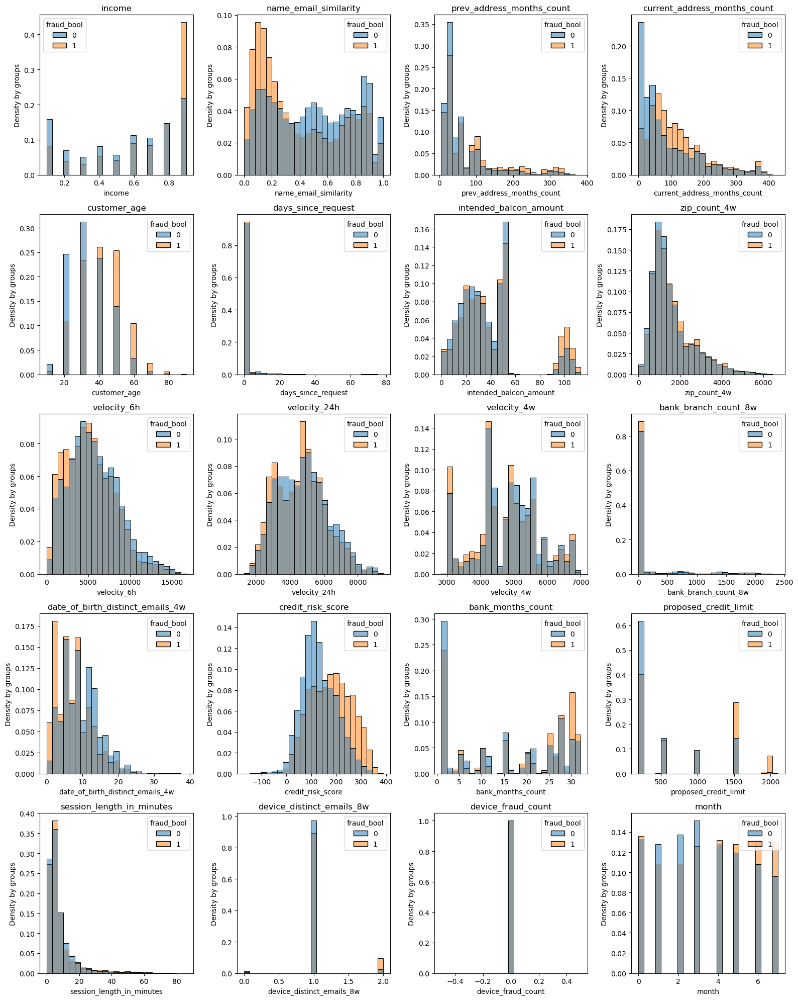

In [28]:
# Create weighted histogram plots of numeric features grouped by 'fraud_bool' categories
fig, ax = plt.subplots(nrows=5, ncols=4, figsize=(16, 20))

# Loop through each column and plot the histograms
for i, colname in enumerate(num_col):
    row = i // 4
    col = i % 4
    
    # Get the counts of each group and calculate weights
    counts = baf_fraud_bool_num.groupby('fraud_bool')[colname].count().values
    weights = [1/counts[0] if val == 0 else 1/counts[1] for val in baf_fraud_bool_num['fraud_bool']]
    
    # Plot the histograms for each fraud_bool group with weights
    sns.histplot(data=baf_fraud_bool_num, x=colname, hue='fraud_bool', weights=weights, bins=25, alpha=0.5, ax=ax[row, col])
    
    # Set axis labels and title
    ax[row, col].set_xlabel(colname)
    ax[row, col].set_ylabel('Density by groups')
    ax[row, col].set_title(colname)

# Adjust the layout and show plots
plt.tight_layout()
plt.show()


Most of the numeric features are skewed or have multiple peaks, not normal distribution. `sustomer_age`, `credit_risk_score` and `velocity_24h` distribution are close to normal. Still, we can see some distribution difference between `fraud_bool` categories in `income`, `name_email_similarity`, `customer_age`, `intended_balcon_amount`, `credit_resk_score`, `propsed_credit_limit`, `date_of_birth_distinct_emails_4w`, etc.

In [29]:
# In above histogrmas, `customer_age`, `credit_risk_score` and `velocity_24h` distributions are close to normal.
# Perform a t-test of them between 'fraud_bool' categories to see if any significant difference (if p< 0.05)
# Subset fraud and not_fraud dataframes
fraud = baf_fraud_bool_num[baf_fraud_bool_num['fraud_bool'] == 1]
not_fraud = baf_fraud_bool_num[baf_fraud_bool_num['fraud_bool'] == 0]

# perform Levene's test for equality of variances
for col in ['customer_age', 'credit_risk_score','velocity_24h']:
    stat, p = levene(fraud[col], not_fraud[col])
    if p > 0.05:
        print(f'The variances of {col} in the two groups are equal.')
    else:
        print(f'The variances of {col} in the two groups are significantly different')

The variances of customer_age in the two groups are significantly different
The variances of credit_risk_score in the two groups are significantly different
The variances of velocity_24h in the two groups are significantly different


In [30]:
# Perform Welch's t-test as the variances are not equal between 'fraud_bool' groups
for col in ['customer_age', 'credit_risk_score','velocity_24h']:
    t_statistic, p_value = ttest_ind(fraud[col], not_fraud[col], equal_var=False)
    print(f'{col} - T-statistic: {t_statistic:.2f}, P-value: {p_value:.4f}')

customer_age - T-statistic: 57.79, P-value: 0.0000
credit_risk_score - T-statistic: 60.05, P-value: 0.0000
velocity_24h - T-statistic: -11.55, P-value: 0.0000


`customer_age`, `credit_risk_score` and `velocity_24h` features seem to have significant difference between 'fraud_bool' groups.

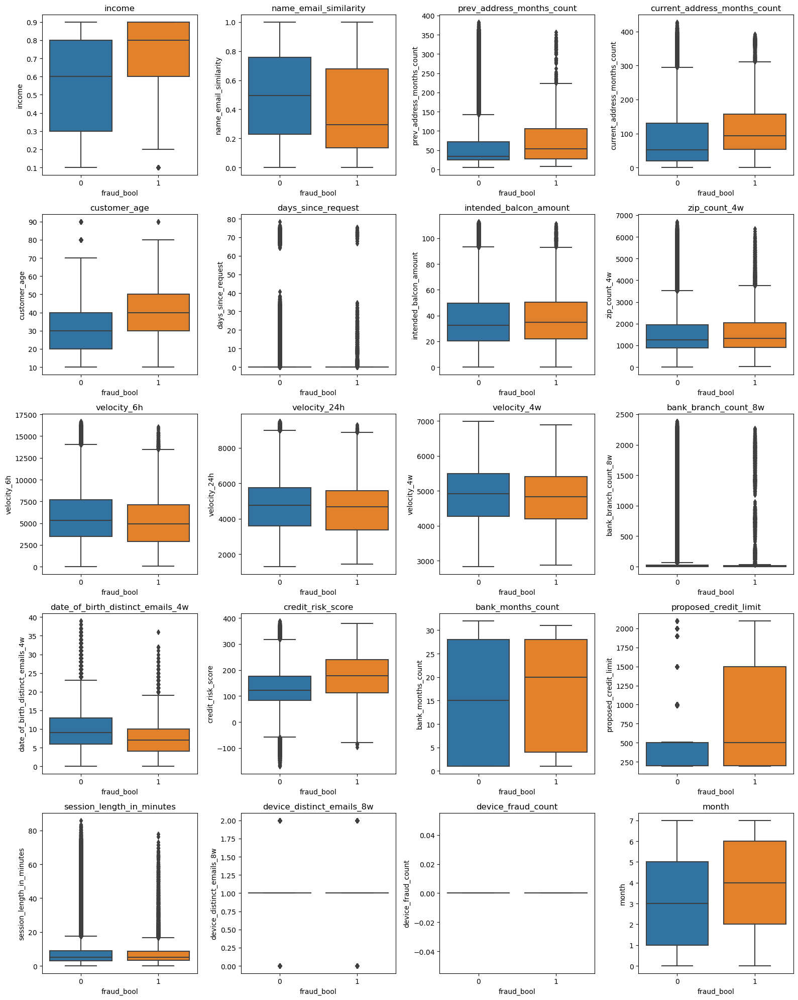

In [31]:
# Create boxplots to see numeric features quartiles distribution and possible outliers
fig, ax = plt.subplots(nrows=5, ncols=4, figsize=(16, 20))

# Loop through each column and plot the histograms
for i, colname in enumerate(num_col):
    row = i // 4
    col = i % 4
    
    # Plot the histograms for each fraud_bool group with weights
    sns.boxplot(data=baf_fraud_bool_num, x='fraud_bool', y=colname, ax=ax[row, col])
    
    # Set axis labels and title
    ax[row, col].set_xlabel('fraud_bool')
    ax[row, col].set_ylabel(colname)
    ax[row, col].set_title(colname)

# Adjust the layout and show plots
plt.tight_layout()
plt.show()

Box plots of the numeric features show clearer difference of median values and quartile ranges of each feature between `fraud_bool` groups. We can see the difference in the same features mentioned under the hisgram plots, and `bank_months_count`, `month` as well. The difference in `intended_balcon_amount` was not as clear as the above histogram plot, as the higher difference part became the points above the upper whisker.

Some of the features have a narrow quartile range but very wide outlier points range, such as `days_since_request` and `bank_branch_count_8w`. They may be converted with log(x+1)? `Need to discuss with mentor here`. How about `session_length_in_minutes`?

For the rest of the columns, removing the outliers might be better for modeling, but it would remove the distribution difference as well, for example, `intended_balcon_amount`. I am inclined to not to remove. `Need to discuss with mentor here`.

In [ ]:
# Drop 'device_fraud_count' column from the dataframes, as it contributes no difference.
baf_data.drop(columns='device_fraud_count', inplace=True)
num_col.remove('device_fraud_count')
baf_fraud_bool_num = baf_data[['fraud_bool'] + num_col]
# baf_fraud_bool_num.info()


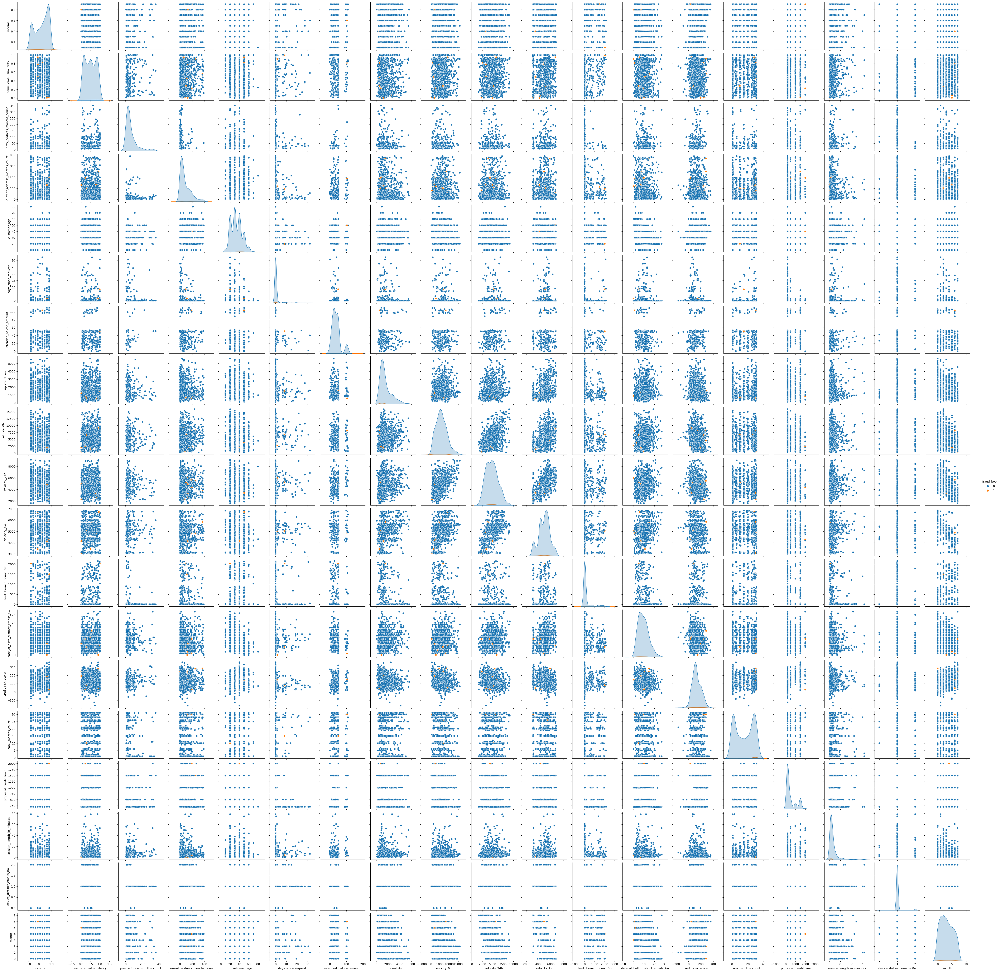

In [40]:
# Draw scatter plots of all numeric features pairwisely, to see if any correlations.
# As it takes too long to run with all data points, draw the plot with randomly selected 1000 sample.
sns.pairplot(baf_fraud_bool_num.sample(1000), hue='fraud_bool')

It's not too easy to see linear correlations here. Only between 'velocity_6h' and 'velocity_24h', 'velocity_24h' and 'velocity_4w' there seem to be linear correlations. It may also relates to the data point numbers. Let's calculate the correlation matrix and draw a heat map to see if it could be clearer.

In [43]:
# Calculate correlation matrix of baf_fraud_bool_num
corr_matrix = baf_fraud_bool_num[num_col].corr()


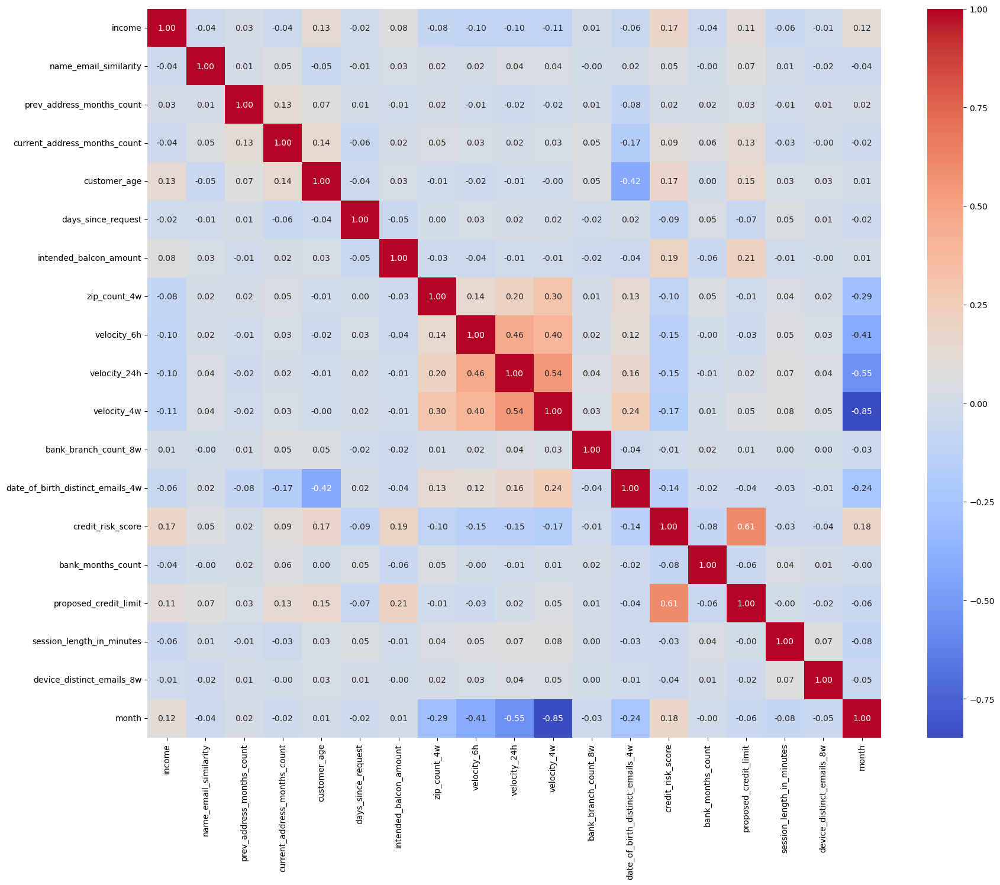

In [50]:
# Draw heat map of corr_matrix
plt.figure(figsize=(20, 16))
sns.heatmap(corr_matrix, annot=True, fmt='.2f', cmap='coolwarm')
plt.show()

`velocity_4w` and `month` are negatively correlated. `proposed_credit_limit` and `credit_risk_score` are moderately correlated.

### 3.3.5 Feature importance of numeric columns

Calculate the feature importance using tree-based Random Forest model, to rank the features based on their importance in predicting the binary target.

In [56]:
# As Random forest model throws error for missing values,
# and features with NaN are not close to normal distribution,
# use the imputer with strategy = 'median' for now.
imputer = SimpleImputer(missing_values=np.nan, strategy='median')
baf_fraud_bool_num_imputed = pd.DataFrame(imputer.fit_transform(baf_fraud_bool_num[num_col]), columns=num_col)

# Define the Random Forest classifier and fit with imputed data,
# Calculate feature importance using RandomForestClassifier
rf = RandomForestClassifier(random_state=42)
rf.fit(baf_fraud_bool_num_imputed, baf_fraud_bool_num['fraud_bool'])
importances = rf.feature_importances_


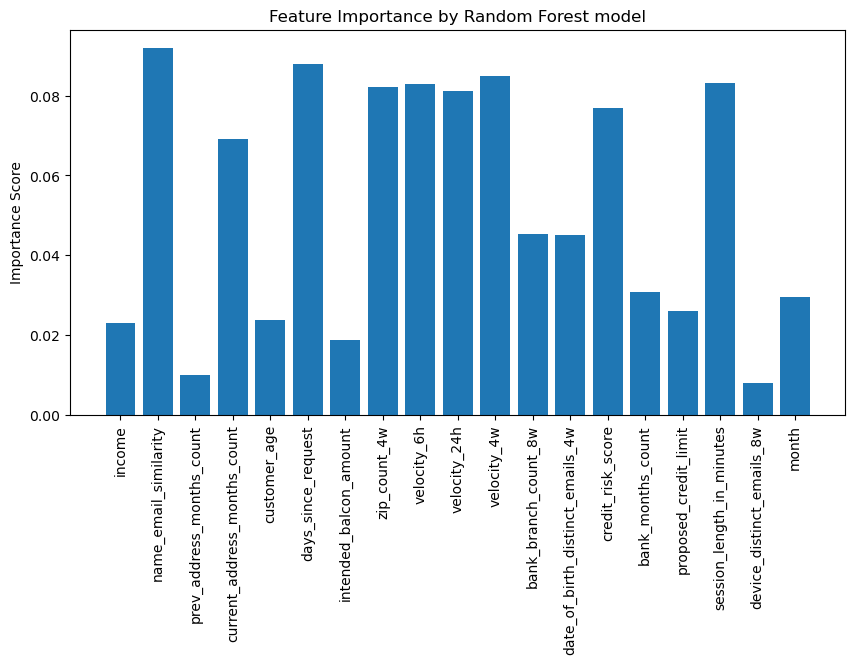

In [62]:
# Plot the feature importances using a bar chart
%matplotlib inline

plt.figure(figsize=(10, 5))
plt.bar(num_col, importances)
plt.ylabel('Importance Score')
plt.title("Feature Importance by Random Forest model")
plt.xticks(rotation=90)
plt.show()

In [68]:
print(num_col)

['income', 'name_email_similarity', 'prev_address_months_count', 'current_address_months_count', 'customer_age', 'days_since_request', 'intended_balcon_amount', 'zip_count_4w', 'velocity_6h', 'velocity_24h', 'velocity_4w', 'bank_branch_count_8w', 'date_of_birth_distinct_emails_4w', 'credit_risk_score', 'bank_months_count', 'proposed_credit_limit', 'session_length_in_minutes', 'device_distinct_emails_8w', 'month']


The importance scores are normalized and sum up to 1.0 across all the features. The higher scores indicate greater impact on the model, but that's not absolutely true. Some features may be important even if they have relatively low importance scores.

In [66]:
# Calculate the permutation importance scores
result = permutation_importance(rf, baf_fraud_bool_num_imputed[num_col], baf_fraud_bool_num['fraud_bool'], n_repeats=10, random_state=42)
importances = result.importances_mean

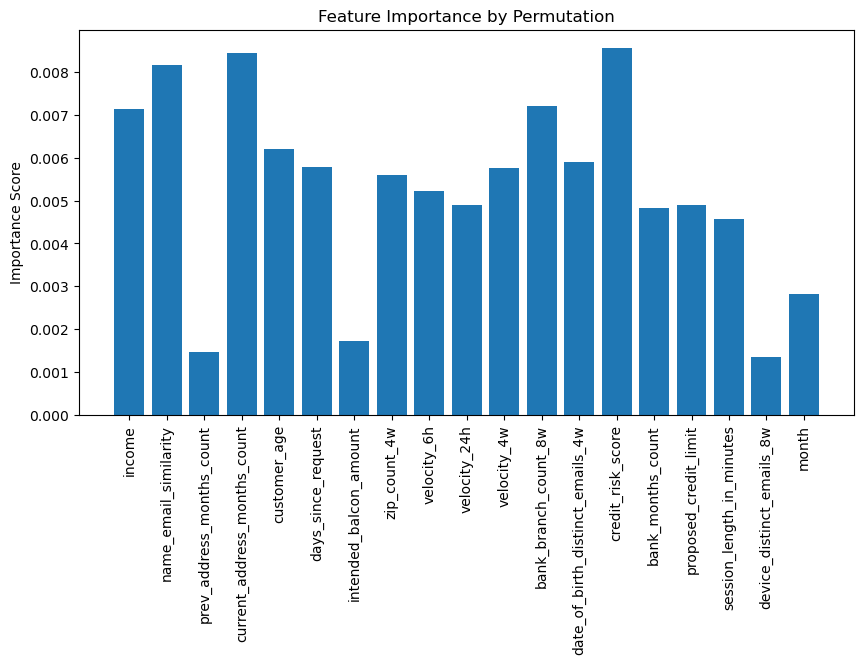

In [67]:
# Plot the feature importances using a bar chart
%matplotlib inline
plt.figure(figsize=(10, 5))
plt.bar(num_col, importances)
plt.ylabel('Importance Score')
plt.title("Feature Importance by Permutation")
plt.xticks(rotation=90)
plt.show()

While there are big difference of importance scores in some features, we may sorting the scores from high to low and select the features have both higher scores for the moment. The first 10 features are `credit_risk_score`, `current_address_months_count`, `name_email_similarity`, `bank_branch_count_8w`, `days_since_request`, `zip_count_4w`, `date_of_birth_distinct_emails_4w`, `velocity_6h`, `velocity_24h`, `velocity_4w`. There are Features with big difference may be looked in again to decide if need more processing.

### 3.3.6 One-hot encoding of not binary categorical features, and feature importance

In [ ]:
# Non binary categorical features one-hot encoding,
# and reduce groups.

In [ ]:
# Categorical features importance scores by Random Forest

In [ ]:
# Categorical features importance scores by Permutation.

As the `fraud_bool` targeting feature is quite imbalanced, fraud instance has only about 1.1%, the above importance scores may not be very accurate. For the training and modeling part features selection may still need to be adjusted, or use all at the beginning.

Summary:

For the EDA analysis, previouly processed data was loaded and treated for negative values again, with some response information from the dataset author. For missing values, `current_address_months_count`, `session_length_in_minutes`, `device_distinct_emails_8w` and `velocity_6h` have missing value counts below 1%. Those missing values rows were dropped. `intended_balcon_amount`, `prev_address_months_count` and `bank_months_count` still have missing values left, which may be imputed with median or mean methods during modeling training.

Then the categorical columns are explored, our targeting column is very imbalanced, with fraud records only about 1.1%. This may add some bias and need to be considered when selecting modeling and evaluation methods later on. Basic statistics summary and visualization of categorical features with normalized count plots for distribution difference between targeting groups. Chi-squared test and crosstab were used to check correlations. Whether need to be normalized in statistic tests and heat map need to discuss with mentor.

For numeric features, summary statistics and weighted histogram visualization and box plots were also performed for exploration. Welch's t-test was performed on close to normal distribution features `customer_age`, `credit_risk_score` and `velocity_24h` and found significant difference between targeting groups. Features with big ranges of outliers and not normal distribution data need to be discussed with mentor, whether need to tranform with log(x+1) or not, and other outliers should they be removed or kept. `device_fraud_count` feature contributes no difference towards 'fraud_bool' and will be removed. pairplot and correlation matrix heat maps were also drawn but not many strong linear correlation found in numeric features.

Numeric feature importance scores were calculated by Randome forest modeling and permutation method. median imputing was used for missing values. As the target column is very imbalanced, the result scores may not biased to some extent. By sorting scores of both methods in descending order, the first 10 features are `credit_risk_score`, `current_address_months_count`, `name_email_similarity`, `bank_branch_count_8w`, `days_since_request`, `zip_count_4w`, `date_of_birth_distinct_emails_4w`, `velocity_6h`, `velocity_24h`, `velocity_4w`.

For categorical features with non binary values, One-hot encoding will be performed. Feature importance scores will also be calculated.

Still, since the target column values are very imbalanced. Feature selection and model and evaluation metrics may still need to be tried and tested. Maybe use all features or the above selected high scores ones to start.